In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

### Filter

In [40]:
kernel = np.array([[0,-1,0],
                   [-1,5,-1],
                   [0,-1,0]])
kernel2 = np.array([[1,0,1],
                   [0,1,0],
                   [1,0,1]])

In [45]:
image = cv2.imread('Temp/beach-blue.jpg')
image_RGB = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)

In [46]:
def apply_filter(image,kernel):
    r,g,b=cv2.split(image)
    b_new = cv2.filter2D(b,-1,kernel)
    g_new = cv2.filter2D(g,-1,kernel)
    r_new = cv2.filter2D(r,-1,kernel)
    image_filtered=cv2.merge([r_new,g_new,b_new])
    return image_filtered

def apply_filter2(image,kernel):
    image_filtered = cv2.filter2D(image,-1,kernel)
    return image_filtered

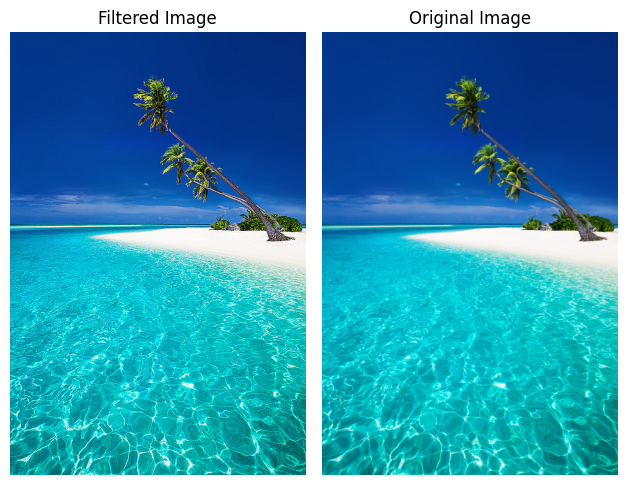

In [49]:
image = apply_filter(image_RGB,kernel)
plt.subplot(1,2,1)
plt.imshow(image)
plt.title('Filtered Image')
plt.axis('off')
plt.subplot(1,2,2)
plt.imshow(image_RGB)
plt.title('Original Image')
plt.axis('off')
plt.tight_layout()
plt.show()

### Blurring and Sharpening

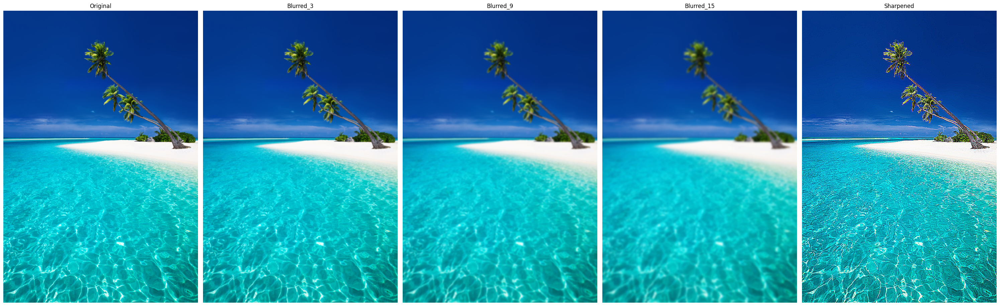

In [3]:
image = cv2.imread('Temp/beach-blue.jpg')
image_RGB = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)

kernelSize = [(3,3),(9,9),(15,15)]

blurred_3 = cv2.GaussianBlur(image_RGB,kernelSize[0],0)
blurred_9 = cv2.GaussianBlur(image_RGB,kernelSize[1],0)
blurred_15 = cv2.GaussianBlur(image_RGB,kernelSize[2],0)

custom_kernel = np.array([[-1,-1,-1],
                            [-1,9,-1],
                            [-1,-1,-1]])

sharpened_image = cv2.filter2D(image_RGB,-1,custom_kernel)
plt.figure(figsize=(30,15))

plt.subplot(1,5,1)
plt.imshow(image_RGB)
plt.title('Original')
plt.axis('off')

plt.subplot(1,5,2)
plt.imshow(blurred_3)
plt.title('Blurred_3')
plt.axis('off')

plt.subplot(1,5,3)
plt.imshow(blurred_9)
plt.title('Blurred_9')
plt.axis('off')

plt.subplot(1,5,4)
plt.imshow(blurred_15)
plt.title('Blurred_15')
plt.axis('off')

plt.subplot(1,5,5)
plt.imshow(sharpened_image)
plt.title('Sharpened')
plt.axis('off')
plt.tight_layout()
plt.show()

### Contrast

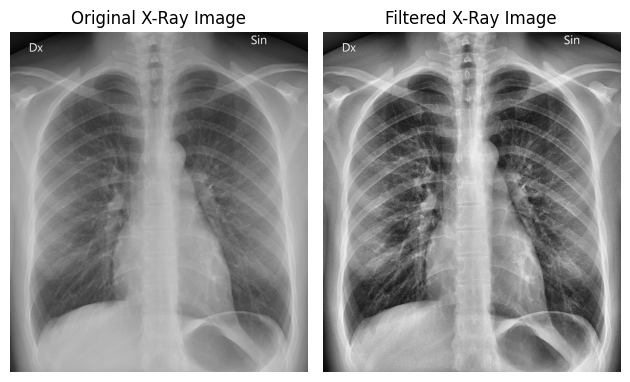

In [27]:
image = cv2.imread('Temp/xray.jpg')

image_RGB = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

clahe = cv2.createCLAHE(clipLimit=2,tileGridSize=(8,8))
gray = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
cl1=clahe.apply(gray)

plt.subplot(1,2,1)
plt.imshow(gray,cmap='gray')
plt.title('Original X-Ray Image')
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(cl1,cmap='gray')
plt.title('Filtered X-Ray Image')
plt.axis('off')
plt.tight_layout()

### Contrast using LAB

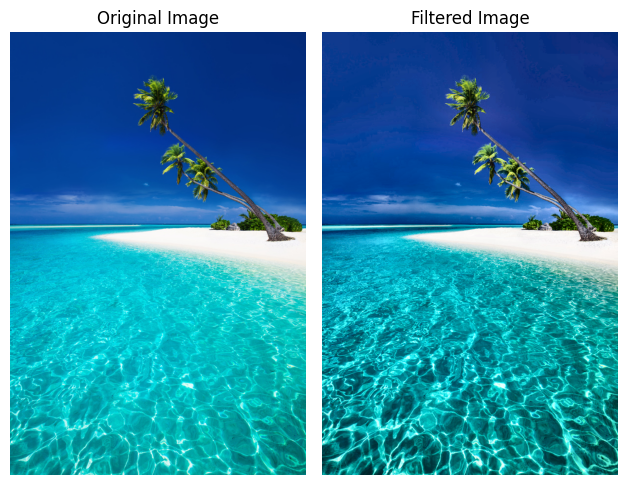

In [31]:
image = cv2.imread('Temp/beach-blue.jpg')

image_RGB = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
image_LAB = cv2.cvtColor(image_RGB,cv2.COLOR_RGB2LAB)

l,a,b = cv2.split(image_LAB)

clahe = cv2.createCLAHE(clipLimit=2,tileGridSize=(8,8))

cl1 = clahe.apply(l)
lab_clahe = cv2.merge((cl1,a,b))
image_RGB_filtered = cv2.cvtColor(lab_clahe,cv2.COLOR_LAB2RGB)

plt.subplot(1,2,1)
plt.imshow(image_RGB)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(image_RGB_filtered)
plt.title('Filtered Image')
plt.axis('off')
plt.tight_layout()

### Adding noisy Image

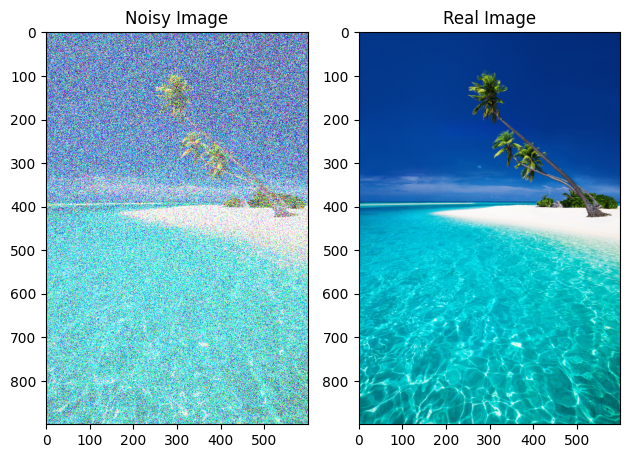

In [10]:
image = cv2.imread('Temp/beach-blue.jpg')
image_RGB = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
noise = np.random.normal(100,140,image.shape)
noisy_image = image+noise

noisy_image = np.clip(noisy_image,0,255).astype(np.uint8)

noi_image_RGB = cv2.cvtColor(noisy_image,cv2.COLOR_BGR2RGB)

plt.subplot(1,2,1)
plt.title('Noisy Image')
plt.imshow(noi_image_RGB)

plt.subplot(1,2,2)
plt.title('Real Image')
plt.imshow(image_RGB)
plt.tight_layout()
plt.show()

### Resize Image

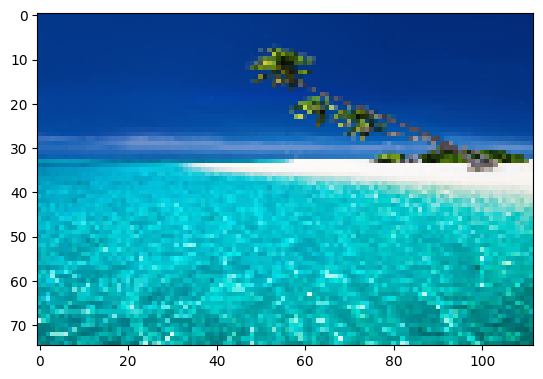

In [ ]:
height, width, _ = image.shape

new_width = int(width/8)
new_height = int(height/8)
new_value = (new_height, new_width)

rescaled_image = cv2.resize(image_RGB,new_value,interpolation=cv2.INTER_LINEAR)

# plt.Figure(figsize=(9,16))
plt.imshow(rescaled_image)

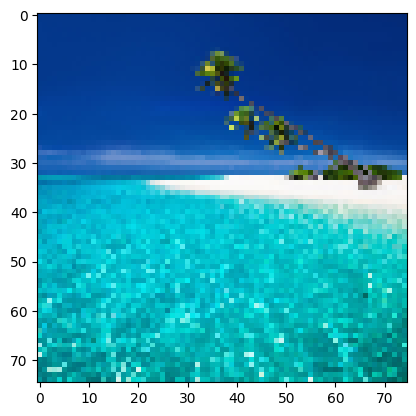

In [12]:
height, width, _ = image.shape

new_width = int(width/8)
new_height = int(height/8)
new_value = (new_width, new_width)

rescaled_image = cv2.resize(image_RGB,new_value,interpolation=cv2.INTER_LINEAR)

plt.imshow(rescaled_image)

### Crop Image

In [28]:
image_RGB.shape

(900, 600, 3)

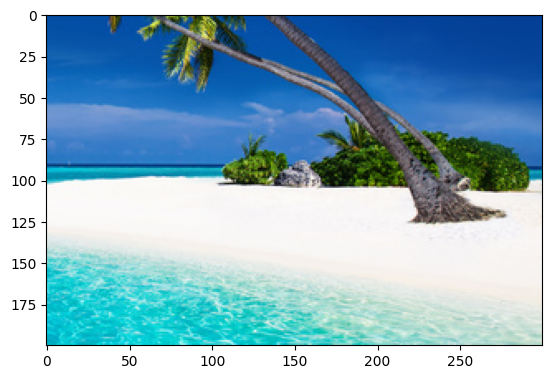

In [27]:
cropped_image = image_RGB[300:500, 300:800]

plt.imshow(cropped_image)

### Rotating Image

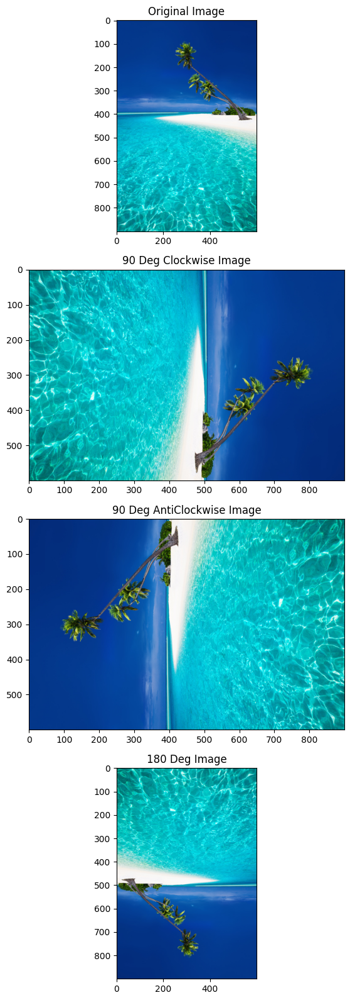

In [43]:
image_90 = cv2.rotate(image_RGB, cv2.ROTATE_90_CLOCKWISE)
image_90_counter = cv2.rotate(image_RGB,cv2.ROTATE_90_COUNTERCLOCKWISE)
image_180 = cv2.rotate(image_RGB,cv2.ROTATE_180)

plt.figure(figsize=(20,16))

plt.subplot(4,1,1)
plt.imshow(image_RGB)
plt.title('Original Image')

plt.subplot(4,1,2)
plt.imshow(image_90)
plt.title('90 Deg Clockwise Image')

plt.subplot(4,1,3)
plt.imshow(image_90_counter)
plt.title('90 Deg AntiClockwise Image')

plt.subplot(4,1,4)
plt.imshow(image_180)
plt.title('180 Deg Image')

plt.tight_layout()

### Rotate image using WarpAffine

900 600


Text(0.5, 1.0, 'Original')

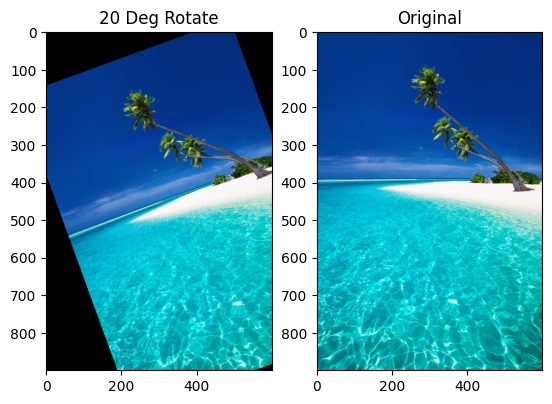

In [51]:
image = cv2.imread('Temp/beach-blue.jpg')
image_RGB = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)

width, height, _ = image.shape

print(width,height)

center = (width/2,height/2)

rotation_matrix = cv2.getRotationMatrix2D(center=center,angle=20,scale=1)
# rotation_matrix_2 = cv2.getRotationMatrix2D(center=center,angle=160,scale=1)

rotate_image = cv2.warpAffine(src=image_RGB,M=rotation_matrix,dsize=(height,width))
# rotate_image_2 = cv2.warpAffine(src=image_RGB,M=rotation_matrix_2,dsize=(height,width))

plt.subplot(1,2,1)
plt.imshow(rotate_image)
plt.title('20 Deg Rotate')

plt.subplot(1,2,2)
plt.imshow(image_RGB)
plt.title('Original')



### Flip Image

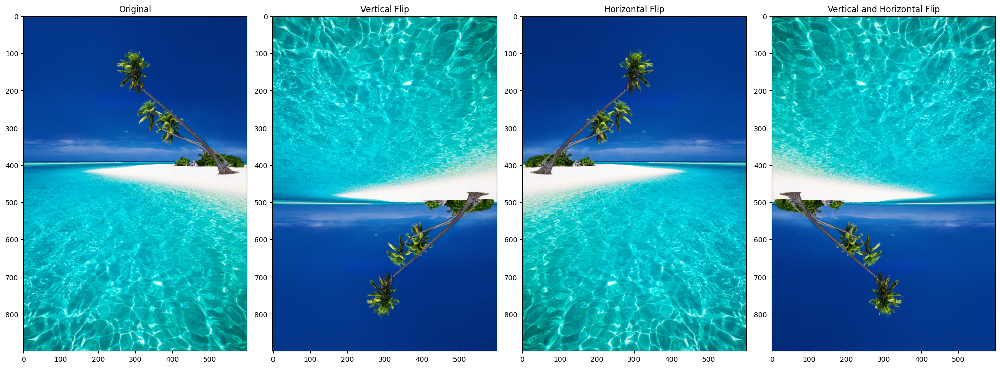

In [55]:
flip_image_vr = cv2.flip(image_RGB,0)
flip_image_hr = cv2.flip(image_RGB,1)
flip_image_hrvr = cv2.flip(image_RGB,-1)

plt.figure(figsize=(20,16))
plt.subplot(1,4,1)
plt.title('Original')
plt.imshow(image_RGB)

plt.subplot(1,4,2)
plt.title('Vertical Flip')
plt.imshow(flip_image_vr)

plt.subplot(1,4,3)
plt.title('Horizontal Flip')
plt.imshow(flip_image_hr)

plt.subplot(1,4,4)
plt.title('Vertical and Horizontal Flip')
plt.imshow(flip_image_hrvr)
plt.tight_layout()


### Reading From Video stream

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
camera = cv2.VideoCapture(0)  ## Default camera
# video = cv2.VideoCapture('path')  ## Video reading

while True:
    ret, frame = camera.read()
    if not ret:
        break

    frame_flip = cv2.flip(frame,1)
    flip_gray = cv2.cvtColor(frame_flip,cv2.COLOR_RGB2GRAY)
    width, height, _ = frame.shape
    combined_frame = np.zeros((width,height*3,3),dtype=np.uint8)
    combined_frame[:,:height] = cv2.cvtColor(frame_flip,cv2.COLOR_RGB2HSV)
    combined_frame[:,height:2*height] = frame_flip
    combined_frame[:,2*height:] = cv2.merge((flip_gray,flip_gray,flip_gray))


    cv2.imshow('Video',combined_frame)
    # cv2.imwrite()
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

camera.release()
cv2.destroyAllWindows()


2024-12-29 10:13:34.149 python[15502:841120] +[IMKClient subclass]: chose IMKClient_Modern
2024-12-29 10:13:34.149 python[15502:841120] +[IMKInputSession subclass]: chose IMKInputSession_Modern


: 